In [96]:
import pandas as pd

import numpy as np

#import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(context = 'notebook', #mostly controls relative sizes of things on plot #The base context is “notebook”, and the other contexts are “paper”, “talk”, and “poster”
        style = 'darkgrid', #dict, None, or one of {darkgrid, whitegrid, dark, white, ticks}
        palette = 'deep', # Should be something that color_palette() can process.
        font_scale = 1, 
        color_codes = False, 
        rc = None)

# from IPython.core.interactiveshell import InteractiveShell 
# InteractiveShell.ast_node_interactivity = 'last_expr' #s etting = "all" allows multiple outputs to be displayed for a given input cell. don't use w plotting!

from IPython.display import display

%matplotlib notebook
#%matplotlib inline

pd.__version__, sns.__version__ , np.__version__ #,  matplotlib.__version__

('0.23.3', '0.9.0', '1.14.2')

In [97]:
# some functions to load
def head_with_full_columns(pd_in, row_amount = 5):
    with pd.option_context('display.max_columns', len(pd_in.iloc[0])):
        display(pd_in[:row_amount])
        
def balanced_sample(df_in, total_size, rand_state):
    s0 = df_in[df_in['TARGET']==0].sample(n = total_size//2, random_state = rand_state)
    s1 = df_in[df_in['TARGET']==1].sample(n = total_size//2, random_state = rand_state)
    new_df = pd.concat([s0,s1])
    new_df.sort_index(inplace = True)
    return new_df

# load df, basic cleaning, sample, and create feature lists

In [98]:
application_train_df = pd.read_csv('application_train.csv', index_col = 'SK_ID_CURR')
# AMT_ANNUITY appears in multiple files, so rename more specifically. 
application_train_df.rename(columns = {"AMT_ANNUITY":"AMT_ANNUITY_from_app_train"} , inplace=True) #index = str, 

# replace NaNs in object entries for now is pretty safe. 
f_list = list(application_train_df.select_dtypes('object').columns)
application_train_df[f_list] = application_train_df[f_list].fillna(value = 'NA')
del f_list

In [99]:
# replace NaNs in CNT_FAMILY_MEMBERS and make it an int
# need to replace NaNs bc pandas does not support NaNs in ints!

fam_med = application_train_df['CNT_FAM_MEMBERS'].median()
application_train_df['CNT_FAM_MEMBERS'] = application_train_df['CNT_FAM_MEMBERS'].fillna(fam_med)
  
# now convert to ints
application_train_df['CNT_FAM_MEMBERS'] = application_train_df['CNT_FAM_MEMBERS'].astype(int)

del fam_med

In [36]:
# get a random sample bc full sample is too much to plot
someee_sample = balanced_sample(application_train_df, 10000, 0)

In [100]:
housing_feats = [f for f in application_train_df.columns if 'AVG' in f or 'MODE' in f or 'MEDI' in f]
doc_feats = [f for f in application_train_df.columns if 'DOCUMENT' in f]
social_circle_feats = [f for f in application_train_df.columns if 'SOCIAL' in f]
amt_req_feats = [f for f in application_train_df.columns if 'AMT_REQ' in f]
phone_email_feats = ['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL']

# null counts

In [39]:
def null_value_counts(df_in, feature):
    """Returns the fraction of TARGET = 0 and 1 for a given feature."""
    nan_counts = df_in[df_in[feature].isnull()]['TARGET'].value_counts()
    if nan_counts.size == 0:
        return None
    
    try: 
        val_0 = nan_counts.loc[0]
    except KeyError:
        val_0 = 0
    
    try:
        val_1 = nan_counts.loc[1]
    except KeyError:
        val_1 = 0
    
    tot = val_0 + val_1
    
    return [tot, val_0/tot, val_1/tot]

In [40]:
nan_dict = {}
for f in someee_sample.columns:
    x = null_value_counts(someee_sample, f)
    if x:
        nan_dict[f] = x

nan_df = pd.DataFrame( nan_dict)#, cols = )
nan_df = nan_df.transpose()
nan_df.columns = ['NaN counts','% TARGET = 0','% TARGET = 1']
nan_df.sort_values('% TARGET = 0')[-20:]

,NaN counts,% TARGET = 0,% TARGET = 1
LIVINGAPARTMENTS_MODE,6993.0,0.480480,0.519520
LIVINGAPARTMENTS_MEDI,6993.0,0.480480,0.519520
YEARS_BUILD_MEDI,6832.0,0.480533,0.519467
YEARS_BUILD_MODE,6832.0,0.480533,0.519467
YEARS_BUILD_AVG,6832.0,0.480533,0.519467
FLOORSMIN_MEDI,6951.0,0.481082,0.518918
FLOORSMIN_MODE,6951.0,0.481082,0.518918
FLOORSMIN_AVG,6951.0,0.481082,0.518918
COMMONAREA_MODE,7135.0,0.481710,0.518290
COMMONAREA_AVG,7135.0,0.481710,0.518290


# plotting subsets of application_train that are mostly not worth anything

## housing feats - there is not much info here. The little info is mostly that these features are recorded at all, which is taken into account in my is-null feature. I think it is best to take just one or two float feats like power_TOTALAREA_MODE as reps for this. 

In [93]:
# split into different dtypes for ploting. 
housing_feats_float = application_train_df[housing_feats].select_dtypes('float64').columns
housing_feats_int = application_train_df[housing_feats].select_dtypes('int64').columns
housing_feats_object = application_train_df[housing_feats].select_dtypes('object').columns

<IPython.core.display.Javascript object>


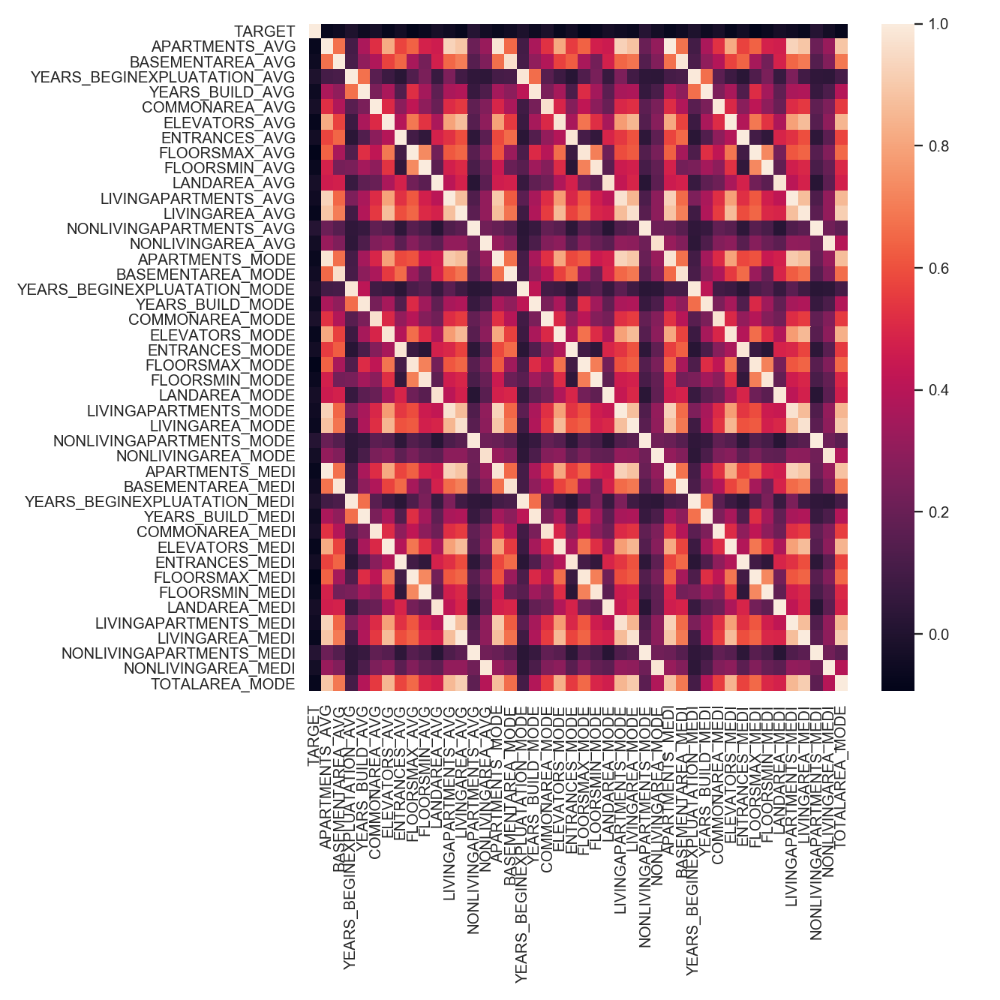

In [11]:
curr_df = someee_sample[['TARGET']+housing_feats].corr()
plt.figure(figsize= (10,10))
sns.heatmap(curr_df, xticklabels= True, yticklabels= True) #vmax=1, vmin = -1,
plt.tight_layout()

<IPython.core.display.Javascript object>


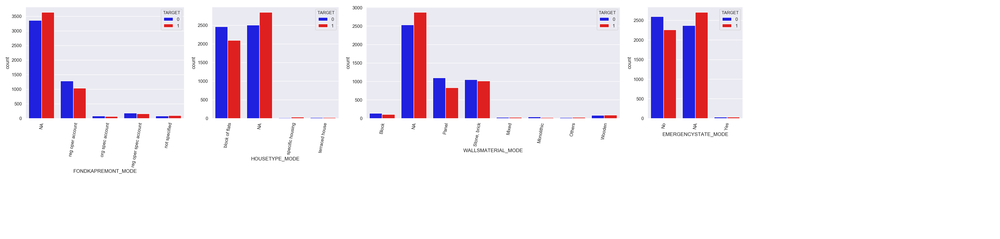

In [48]:
feats = housing_feats_object
this_df = someee_sample

ratios = [len(np.unique(this_df[f])) for f in feats]
tot_width = sum(ratios)/.8

fig, axs = plt.subplots(nrows = 1,
                        ncols = len(feats),
                        gridspec_kw = {'width_ratios':ratios},
                        figsize = (tot_width, 6));

for f, a in zip(feats, range(len(feats))):
    g = sns.countplot(x = f,
                      hue = "TARGET", 
                      data = this_df, 
                      palette = ['blue','red'], 
                      #bw = 1,
                      ax = axs[a]
                       );
    g.set_xticklabels(g.get_xticklabels(), 
                      rotation = 80);

plt.tight_layout()

<IPython.core.display.Javascript object>


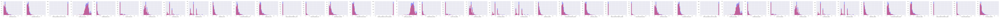

In [31]:
this_df = someee_sample
my_list = someee_sample[housing_feats].select_dtypes('float64').columns
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()

In [51]:
feats_centered_near0 = ['APARTMENTS_AVG', 'BASEMENTAREA_AVG','COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG','LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG',
                 'LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE', 'COMMONAREA_MODE',
                 'ELEVATORS_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE',
                 'NONLIVINGAREA_MODE','APARTMENTS_MEDI','BASEMENTAREA_MEDI','COMMONAREA_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI',
                 'LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','TOTALAREA_MODE']

I try some transformations below, these don't hit every feature, but give us an idea of the usefulness of these features overall.

In [53]:
for f in feats_centered_near0:
    someee_sample['log_' + f] = np.log10(someee_sample[f]+1)

<IPython.core.display.Javascript object>


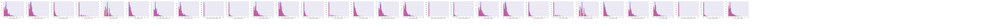

In [62]:
this_df = someee_sample
my_list = [f for f in someee_sample.columns if 'log_' in f]
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()

In [59]:
for f in feats_centered_near0:
    someee_sample['power_' + f] = (someee_sample[f])**(1/3)

<IPython.core.display.Javascript object>


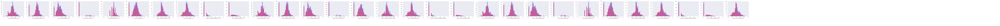

In [60]:
this_df = someee_sample
my_list = [f for f in someee_sample.columns if 'power_' in f]
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()

<IPython.core.display.Javascript object>


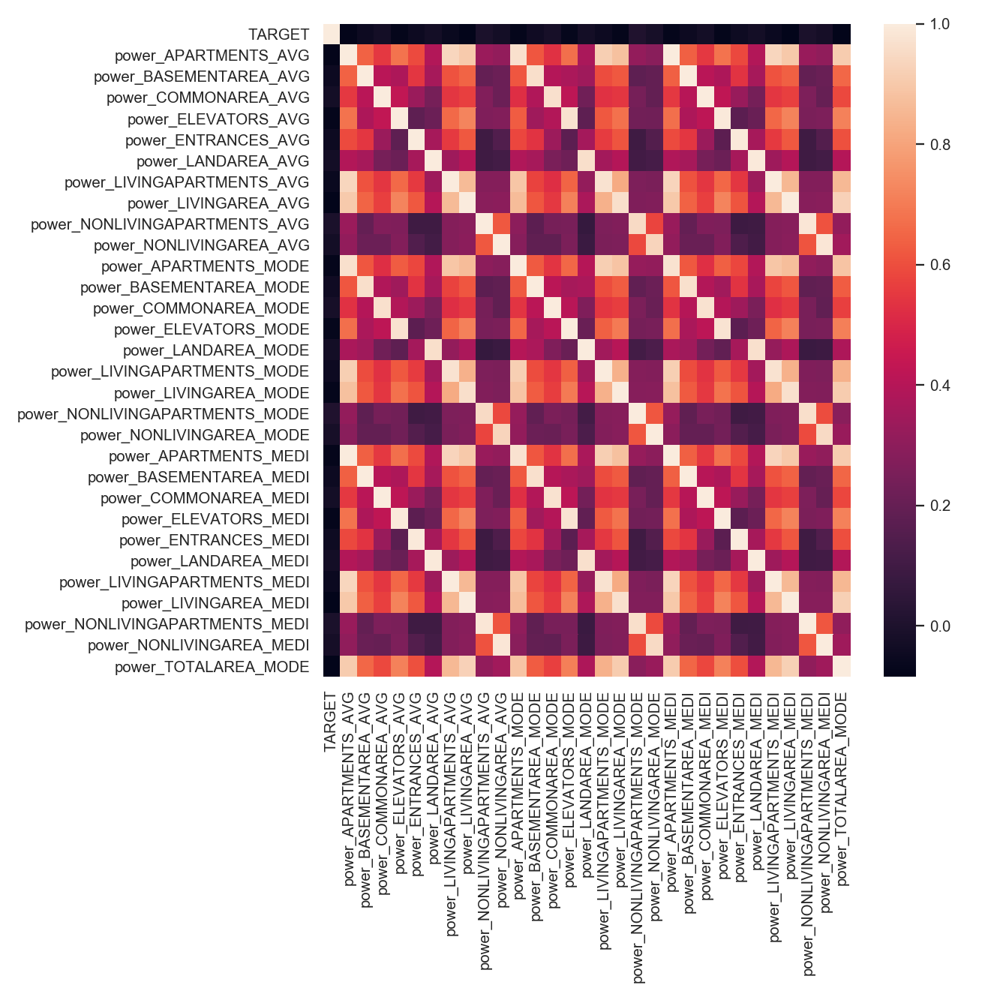

In [63]:
curr_df = someee_sample[['TARGET']+[f for f in someee_sample.columns if 'power_' in f]].corr()
plt.figure(figsize= (10,10))
sns.heatmap(curr_df, xticklabels= True, yticklabels= True) #vmax=1, vmin = -1,
plt.tight_layout()

## document features (note there is no document 1) except for doc 3 and doc 6 there is literally no information here. 

<IPython.core.display.Javascript object>


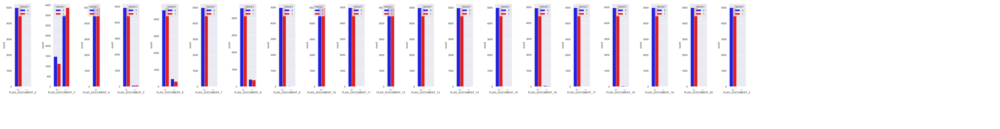

In [65]:
feats = doc_feats
this_df = someee_sample

ratios = [len(np.unique(this_df[f])) for f in feats]
tot_width = sum(ratios)/.8

fig, axs = plt.subplots(nrows = 1,
                        ncols = len(feats),
                        gridspec_kw = {'width_ratios':ratios},
                        figsize = (tot_width, 6));

for f, a in zip(feats, range(len(feats))):
    g = sns.countplot(x = f,
                      hue = "TARGET", 
                      data = this_df, 
                      palette = ['blue','red'], 
                      #bw = 1,
                      ax = axs[a]
                       );
    g.set_xticklabels(g.get_xticklabels(), 
                      rotation = 80);

plt.tight_layout()

<IPython.core.display.Javascript object>


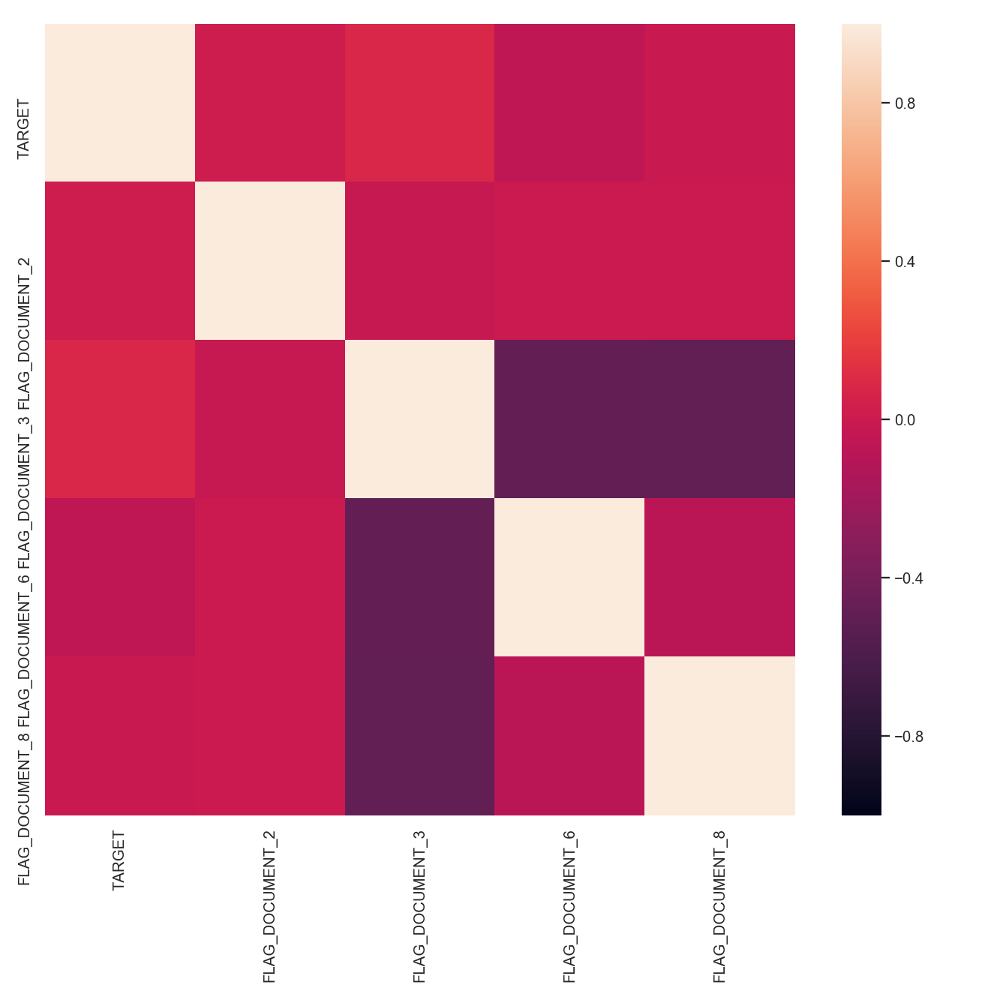

In [68]:
curr_df = someee_sample[['TARGET']+['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_6','FLAG_DOCUMENT_8']].corr()
plt.figure(figsize= (10,10))
sns.heatmap(curr_df, xticklabels= True, yticklabels= True, vmax=1, vmin = -1)
plt.tight_layout()

## social circle feats - no information

<IPython.core.display.Javascript object>


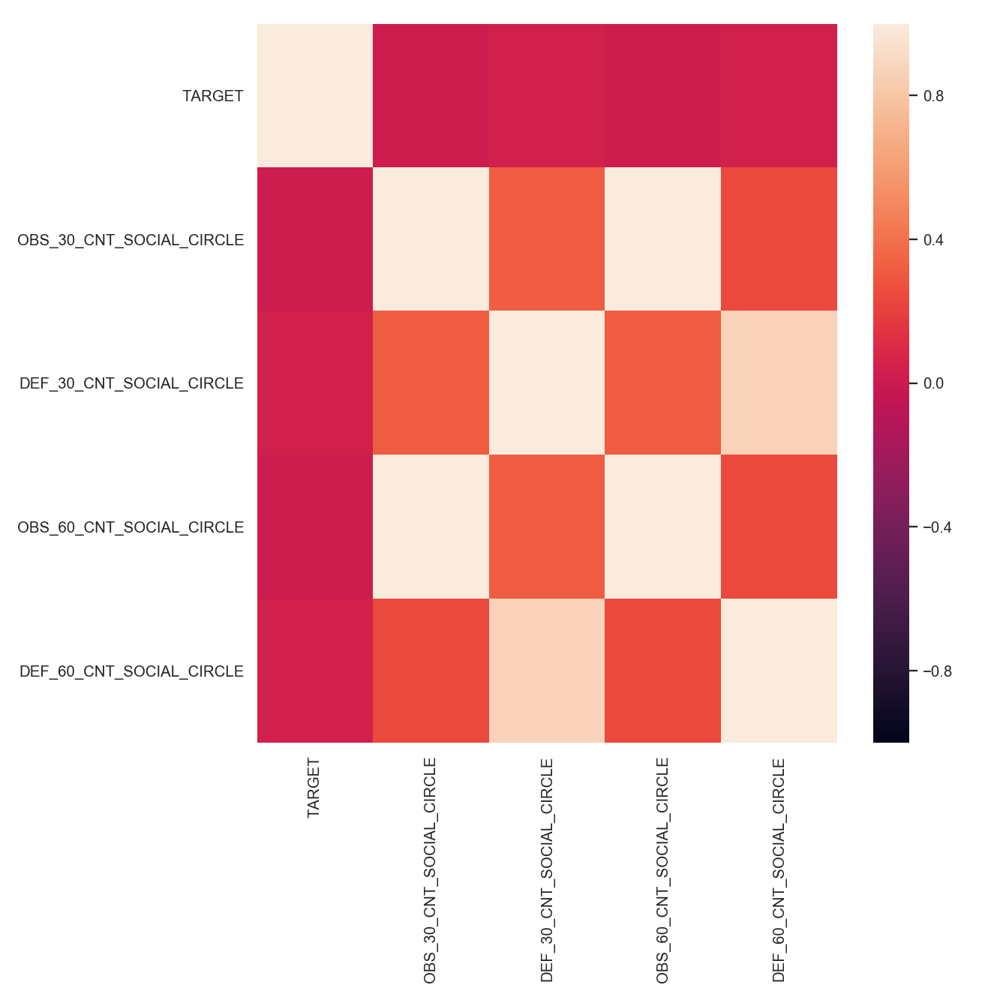

In [71]:
curr_df = someee_sample[['TARGET']+social_circle_feats].corr()
plt.figure(figsize= (10,10))
sns.heatmap(curr_df, xticklabels= True, yticklabels= True, vmax=1, vmin = -1)
plt.tight_layout()

<IPython.core.display.Javascript object>


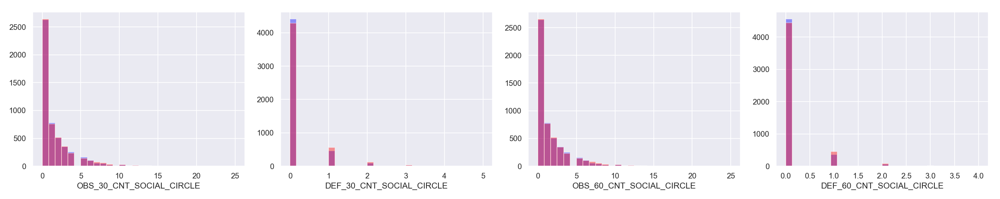

In [72]:
this_df = someee_sample
my_list = social_circle_feats
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()

Transformations won't do much for these b/c they are integers within an order of mag or so (not floats with decimals to distinguish them).

In [87]:
someee_sample[social_circle_feats][:10]

,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE
SK_ID_CURR,,,,
100036,2.0,0.0,2.0,0.0
100055,0.0,0.0,0.0,0.0
100064,0.0,0.0,0.0,0.0
100096,1.0,1.0,1.0,1.0
100160,0.0,0.0,0.0,0.0
100190,5.0,0.0,5.0,0.0
100224,4.0,2.0,4.0,2.0
100246,0.0,0.0,0.0,0.0
100266,2.0,1.0,2.0,1.0


## amt_req feats - not much information here at all

<IPython.core.display.Javascript object>


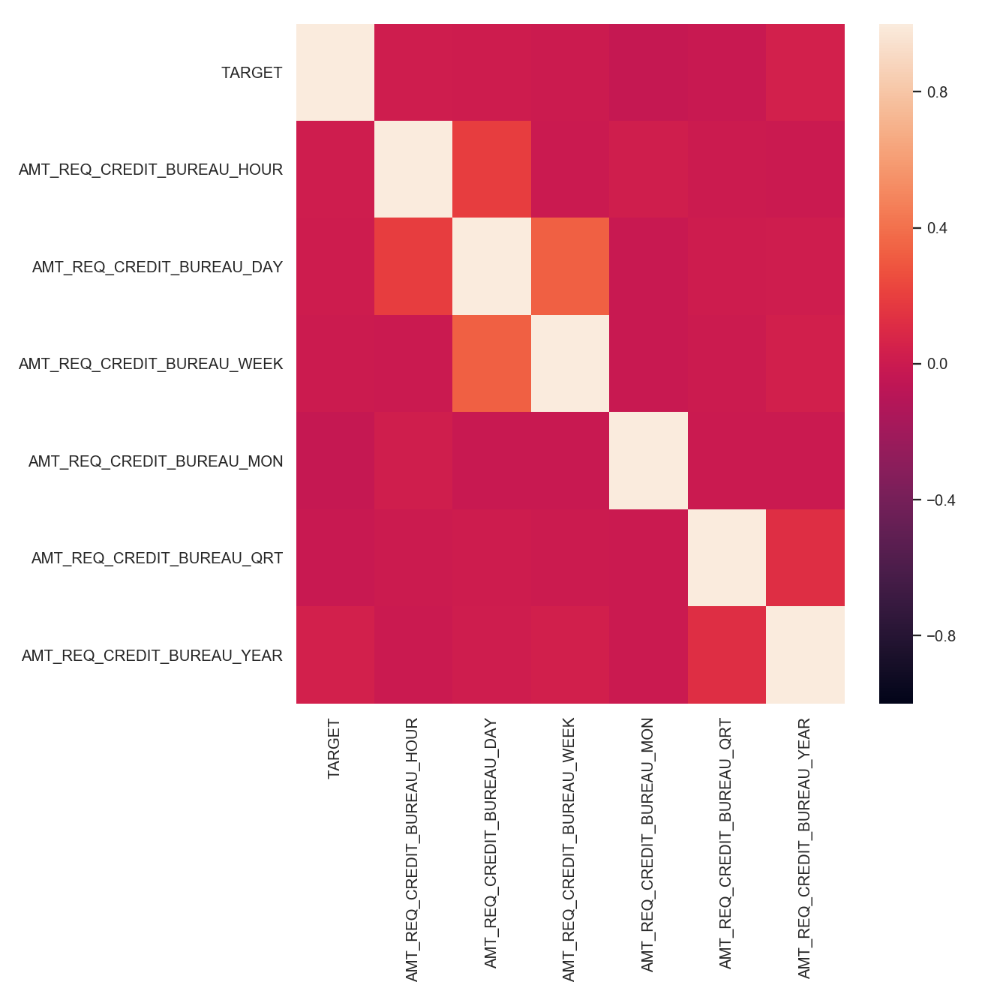

In [90]:
curr_df = someee_sample[['TARGET']+amt_req_feats].corr()
plt.figure(figsize= (10,10))
sns.heatmap(curr_df, xticklabels= True, yticklabels= True, vmax=1, vmin = -1)
plt.tight_layout()

<IPython.core.display.Javascript object>


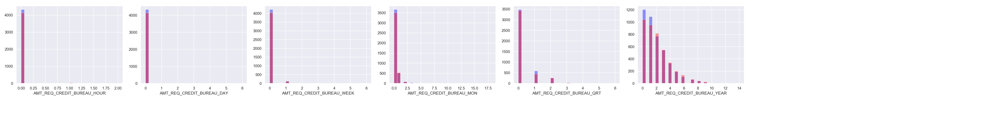

In [91]:
this_df = someee_sample
my_list = amt_req_feats
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()

## phone/email feats - drop FLAG_MOBIL and FLAG_CONT_MOBILE, they have no variance for this sample

In [107]:
someee_sample[phone_email_feats].dtypes

FLAG_MOBIL          int64
FLAG_EMP_PHONE      int64
FLAG_WORK_PHONE     int64
FLAG_CONT_MOBILE    int64
FLAG_PHONE          int64
FLAG_EMAIL          int64
dtype: object

<IPython.core.display.Javascript object>


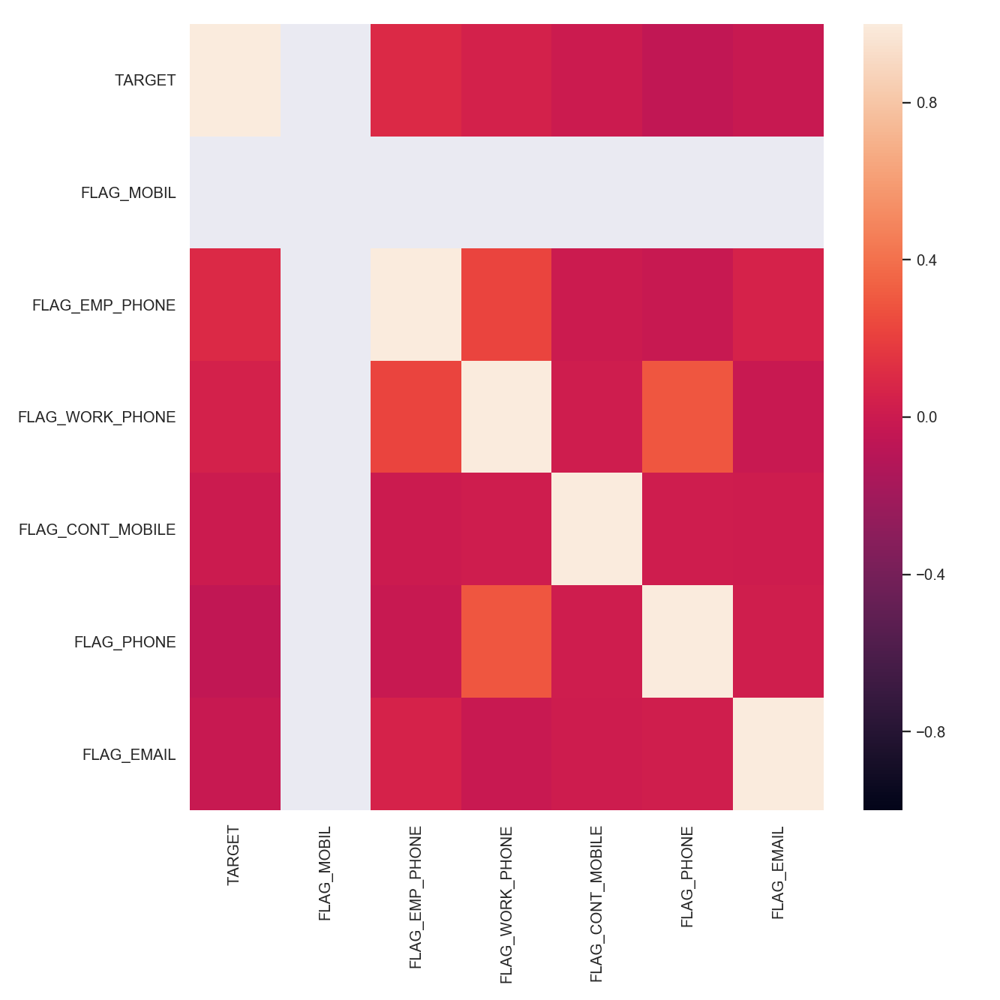

In [102]:
curr_df = someee_sample[['TARGET']+phone_email_feats].corr()
plt.figure(figsize= (10,10))
sns.heatmap(curr_df, xticklabels= True, yticklabels= True, vmax=1, vmin = -1)
plt.tight_layout()

<IPython.core.display.Javascript object>


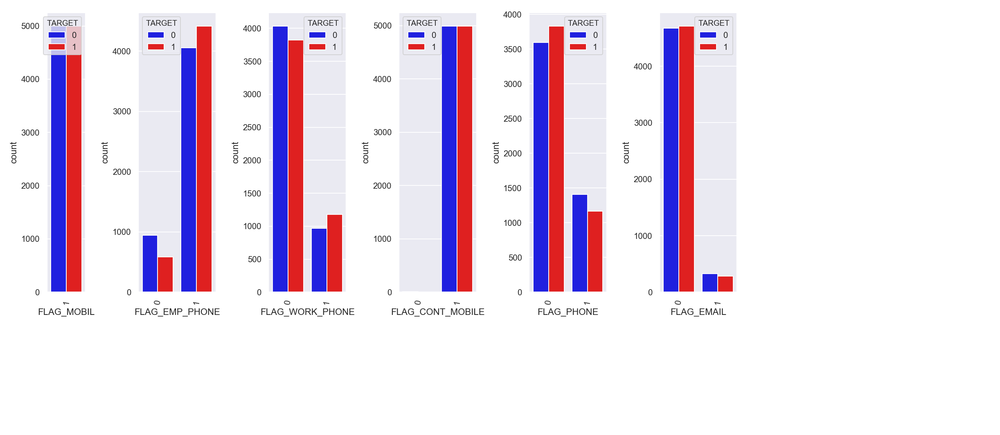

In [108]:
these_feats = phone_email_feats
this_df = someee_sample
# number of values for each feature for plot sizing
ratios = [len(np.unique(this_df[f])) for f in these_feats]
tot_width = sum(ratios)/.8

fig, axs = plt.subplots(nrows = 1,
                        ncols = len(these_feats),
                        gridspec_kw = {'width_ratios':ratios},
                        figsize = (tot_width, 6));

for f, a in zip(these_feats, range(len(these_feats))):
    g = sns.countplot(x = f,
                     hue = "TARGET", 
                     data = this_df, 
                     palette = ['blue','red'], 
                     ax = axs[a]
                    );
    g.set_xticklabels(g.get_xticklabels(), 
                      rotation = 80);

plt.tight_layout()

# remaining plots

In [8]:
# dropping features I already plotted above, except for a handful I want to save. 
feats_to_drop = list(set(housing_feats + doc_feats + social_circle_feats + amt_req_feats+ ['FLAG_MOBIL', 'FLAG_CONT_MOBILE']) - \
{'EMERGENCYSTATE_MODE', 'APARTMENTS_AVG', 'LANDAREA_AVG', 'TOTALAREA_MODE', # these have a bit of info in them
'FLAG_DOCUMENT_3','FLAG_DOCUMENT_6', # these have a bit of info in them
'OBS_60_CNT_SOCIAL_CIRCLE',   # there is no info here, but keeping it as representative feature 
'AMT_REQ_CREDIT_BUREAU_YEAR'  # there is not a lot of info here, but keeping it as representative feature 
})

someee_sample.drop(columns= feats_to_drop, inplace=True)

In [9]:
# break int types into continuous and categorical
int_types = list(someee_sample.select_dtypes('int64') )
num_feats = [len(np.unique(someee_sample[f])) for f in int_types]
app_int_cat_types = [f for f, n in zip(int_types,num_feats) if 25 > n]
app_int_cat_types.remove('TARGET')
app_int_continuous_types = [f for f, n in zip(int_types,num_feats) if 25 <= n]

## plot remaining features - some catagories should be condensed in cleaning

In [10]:
# for categorical feature than have more than one value <1%, condense the <1% values and define a new condensed feature.

for feat in someee_sample.select_dtypes('object').columns:
    percent_srs = someee_sample[feat].value_counts() /len(someee_sample[feat])
    percent_less_than_1 = list(percent_srs[percent_srs <.01].index)
    if len(percent_less_than_1)>1:
        someee_sample[feat + '_condensed'] = someee_sample[feat].apply(lambda x: '<1%' if x in percent_less_than_1 else x)
        someee_sample.drop(columns=[feat], inplace=True)
        
del percent_srs
del percent_less_than_1

<IPython.core.display.Javascript object>


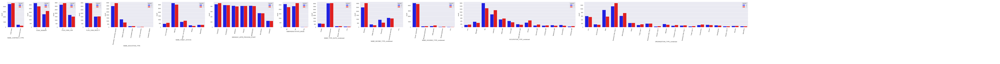

In [11]:
these_feats = someee_sample.select_dtypes('object').columns
this_df = someee_sample
# number of values for each feature for plot sizing
ratios = [len(np.unique(this_df[f])) for f in these_feats]
tot_width = sum(ratios)/.8

fig, axs = plt.subplots(nrows = 1,
                        ncols = len(these_feats),
                        gridspec_kw = {'width_ratios':ratios},
                        figsize = (tot_width, 6));

for f, a in zip(these_feats, range(len(these_feats))):
    g = sns.countplot(x = f,
                     hue = "TARGET", 
                     data = this_df, 
                     palette = ['blue','red'], 
                     ax = axs[a]
                    );
    g.set_xticklabels(g.get_xticklabels(), 
                      rotation = 80);

plt.tight_layout()

<IPython.core.display.Javascript object>


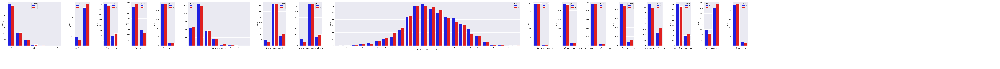

In [12]:
these_feats = app_int_cat_types
this_df = someee_sample

# number of values for each feature for plot sizing
ratios = [len(np.unique(this_df[f])) for f in these_feats]
tot_width = sum(ratios)/.8

fig, axs = plt.subplots(nrows = 1,
                        ncols = len(these_feats),
                        gridspec_kw = {'width_ratios':ratios},
                        figsize = (tot_width, 6));

for f, a in zip(these_feats, range(len(these_feats))):
    g = sns.countplot(x = f,
                     hue = "TARGET", 
                     data = this_df, 
                     palette = ['blue','red'], 
                     ax = axs[a]
                    );
    g.set_xticklabels(g.get_xticklabels(), 
                      rotation = 80);

plt.tight_layout()

<IPython.core.display.Javascript object>


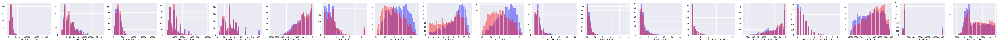

In [13]:
this_df = someee_sample
my_list = list(someee_sample.select_dtypes('float64').columns) + app_int_continuous_types
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()

##  feature transformations on continuous features

In [14]:
list(someee_sample.select_dtypes('float64').columns) + app_int_continuous_types

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY_from_app_train',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'OWN_CAR_AGE',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'LANDAREA_AVG',
 'TOTALAREA_MODE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH']

<IPython.core.display.Javascript object>


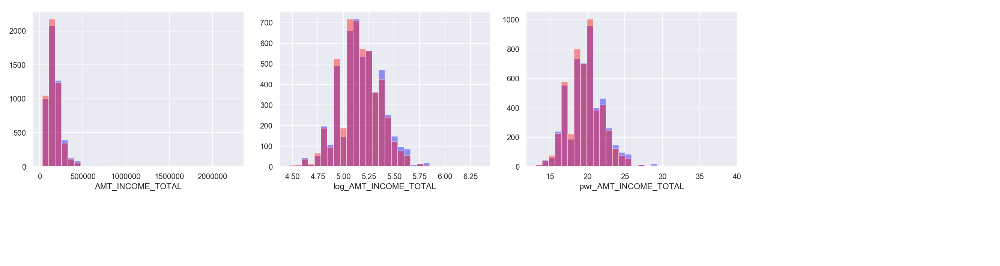

In [15]:
this_df = someee_sample

this_feat = 'AMT_INCOME_TOTAL'
someee_sample['log_'+this_feat] = np.log10( someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (someee_sample[this_feat])**(1/4)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


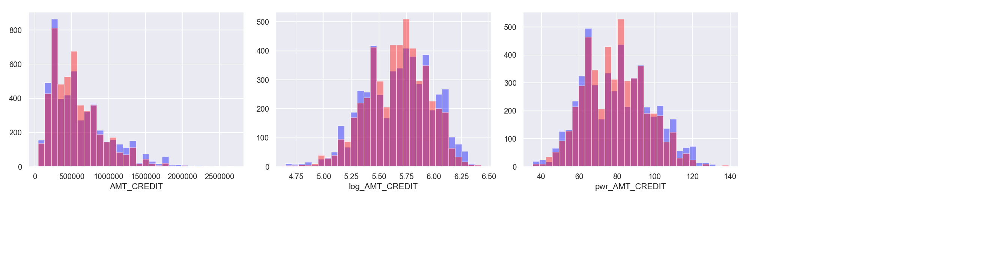

In [16]:
this_df = someee_sample

this_feat = 'AMT_CREDIT'
someee_sample['log_'+this_feat] = np.log10( someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (someee_sample[this_feat])**(1/3)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


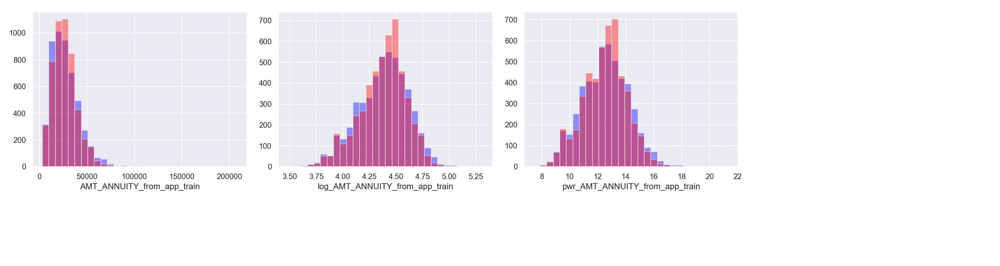

In [17]:
this_df = someee_sample

this_feat = 'AMT_ANNUITY_from_app_train'
someee_sample['log_'+this_feat] = np.log10( someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (someee_sample[this_feat])**(1/4)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


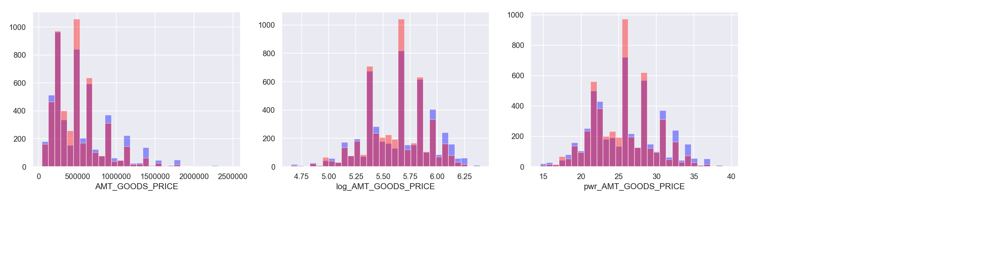

In [18]:
this_df = someee_sample

this_feat = 'AMT_GOODS_PRICE'
someee_sample['log_'+this_feat] = np.log10( someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (someee_sample[this_feat])**(1/4)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


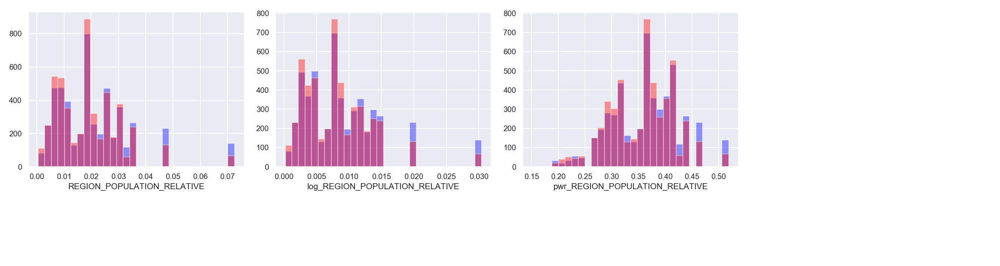

In [19]:
this_df = someee_sample

this_feat = 'REGION_POPULATION_RELATIVE'
someee_sample['log_'+this_feat] = np.log10( someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (someee_sample[this_feat])**(1/4)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


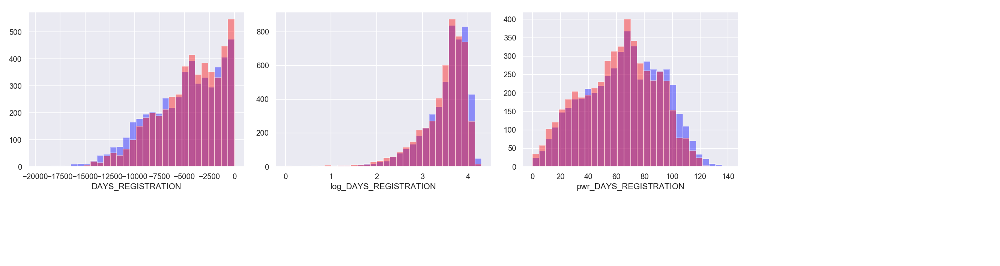

In [20]:
this_df = someee_sample

this_feat = 'DAYS_REGISTRATION'
someee_sample['log_'+this_feat] = np.log10(- someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (-someee_sample[this_feat])**(1/2)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


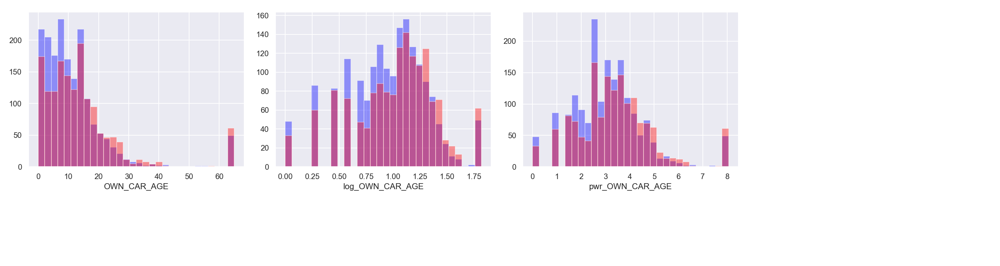

In [21]:
this_df = someee_sample

this_feat = 'OWN_CAR_AGE'
someee_sample['log_'+this_feat] = np.log10(+ someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (+someee_sample[this_feat])**(1/2)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

There are some strange outliers there I am not sure how to interpret.

<IPython.core.display.Javascript object>


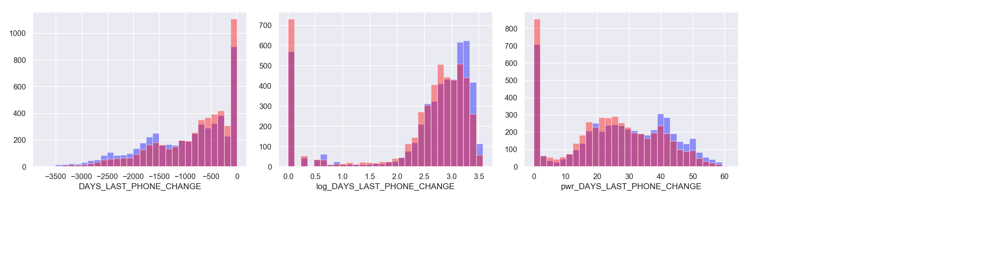

In [22]:
this_df = someee_sample

this_feat = 'DAYS_LAST_PHONE_CHANGE'
someee_sample['log_'+this_feat] = np.log10(- someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (-someee_sample[this_feat])**(1/2)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

<IPython.core.display.Javascript object>


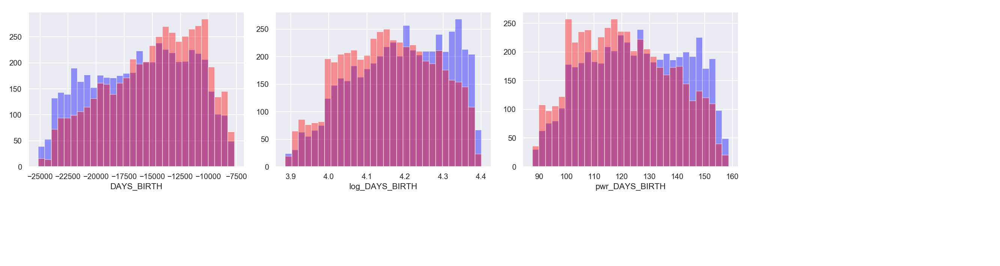

In [23]:
this_df = someee_sample

this_feat = 'DAYS_BIRTH'
someee_sample['log_'+this_feat] = np.log10(- someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (-someee_sample[this_feat])**(1/2)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in log10
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


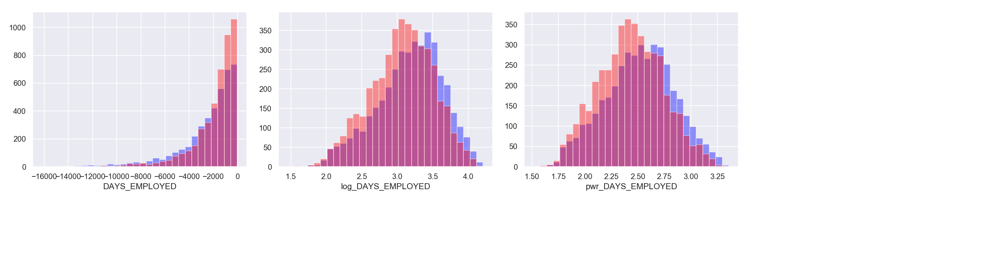

In [24]:
this_feat = 'DAYS_EMPLOYED'
someee_sample['log_'+this_feat] = np.log10(- someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (-someee_sample[this_feat])**(1/8)

this_df = someee_sample[someee_sample['DAYS_EMPLOYED']!=365243]

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5,  4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

Error above is due to 365243 values...

<IPython.core.display.Javascript object>


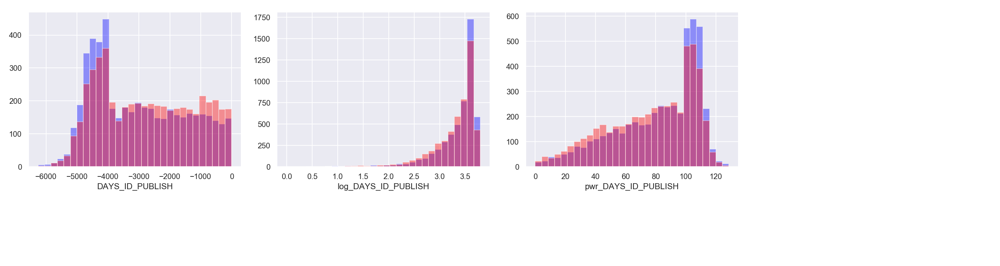

In [25]:
this_df = someee_sample

this_feat = 'DAYS_ID_PUBLISH'
someee_sample['log_'+this_feat] = np.log10(- someee_sample[this_feat] + 1 ) 
someee_sample['pwr_'+this_feat] = (-someee_sample[this_feat])**(1/1.8)

my_list = [this_feat,'log_'+this_feat, 'pwr_'+this_feat]
num_fig = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_fig,
                        figsize = (num_fig*5, 4));

for f, a in zip(my_list, range(len(my_list))):
    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]
    my_bins = np.histogram(dat.values, bins = 30)[1]
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
plt.tight_layout()

## drop many NaN features, one-hot-encode cats then correlations for TARGET and EXT_SOURCEs, REGION_RATING_CLIENT

In [26]:
# drop feats with a huge amount of NaNs for the purpose of the heatmap
feats_temp_drop = ['OWN_CAR_AGE','APARTMENTS_AVG','LANDAREA_AVG','TOTALAREA_MODE','AMT_REQ_CREDIT_BUREAU_YEAR']
df_for_corr = someee_sample.drop(columns=feats_temp_drop)#.dropna()

In [27]:
# one hot encode the cat feats
obj_feats = someee_sample.dtypes[someee_sample.dtypes=='object'].index
for f in obj_feats:
    someee_sample =  pd.concat( [someee_sample, pd.get_dummies(someee_sample[f], prefix = f) ] , axis = 1 )

In [28]:
abs_corr = abs(someee_sample.corr())

In [29]:
abs_corr['TARGET'].sort_values()[-30:]

OCCUPATION_TYPE_condensed_NA                         0.074917
FLAG_DOCUMENT_3                                      0.080249
REG_CITY_NOT_WORK_CITY                               0.082819
pwr_DAYS_ID_PUBLISH                                  0.085162
DAYS_ID_PUBLISH                                      0.089021
CODE_GENDER_F                                        0.089437
CODE_GENDER_M                                        0.089437
OWN_CAR_AGE                                          0.090768
log_OWN_CAR_AGE                                      0.094270
REGION_RATING_CLIENT                                 0.096172
pwr_OWN_CAR_AGE                                      0.098356
DAYS_EMPLOYED                                        0.098759
ORGANIZATION_TYPE_condensed_XNA                      0.100613
FLAG_EMP_PHONE                                       0.100613
NAME_INCOME_TYPE_condensed_Pensioner                 0.100918
REGION_RATING_CLIENT_W_CITY                          0.103591
pwr_DAYS

In [30]:
abs_corr['EXT_SOURCE_1'].sort_values()[-10:]

FLAG_EMP_PHONE                          0.290304
NAME_INCOME_TYPE_condensed_Pensioner    0.290304
ORGANIZATION_TYPE_condensed_XNA         0.290304
CODE_GENDER_M                           0.301039
CODE_GENDER_F                           0.301039
log_DAYS_BIRTH                          0.587682
DAYS_BIRTH                              0.589686
pwr_DAYS_BIRTH                          0.590233
EXT_SOURCE_1                            1.000000
NAME_EDUCATION_TYPE_Academic degree          NaN
Name: EXT_SOURCE_1, dtype: float64

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


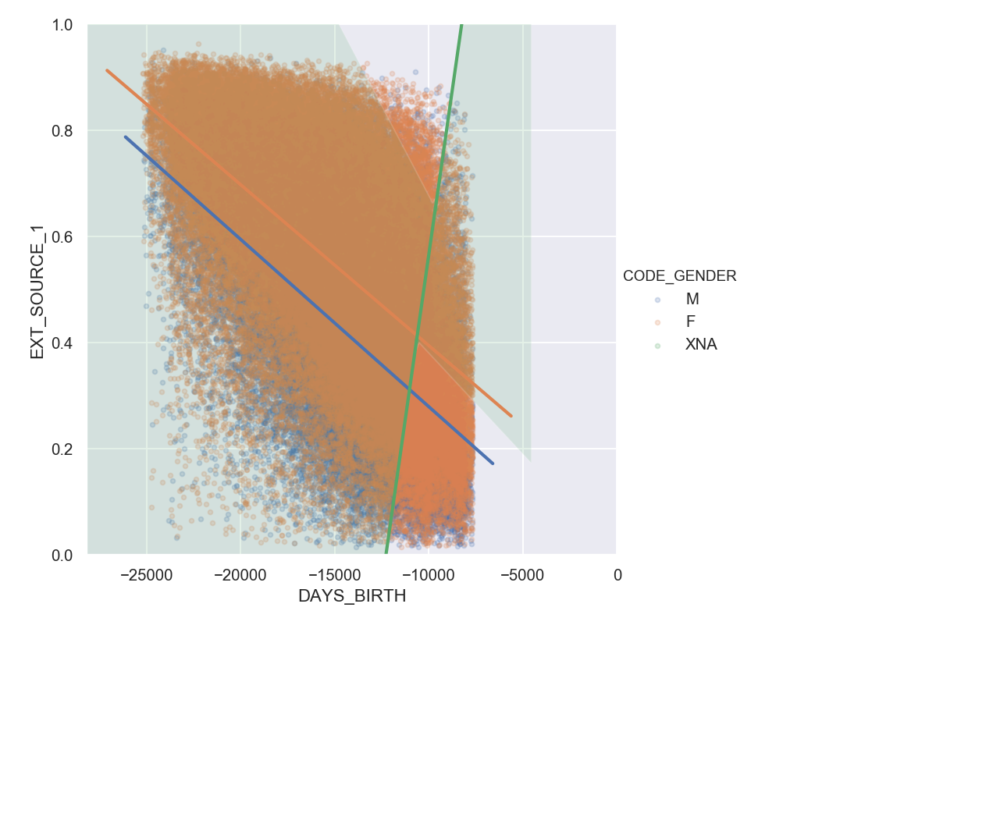

(0, 1)

In [67]:
sns.lmplot(data = application_train_df,
            x = 'DAYS_BIRTH',
            y = 'EXT_SOURCE_1',
            hue = 'CODE_GENDER',
            fit_reg = True,
            scatter_kws={'alpha':.2,"s":10},
            #palette = ['green','orange'],
            legend_out = True,
            height = 6);

plt.xlim(None, 0)
plt.ylim(0, 1)

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


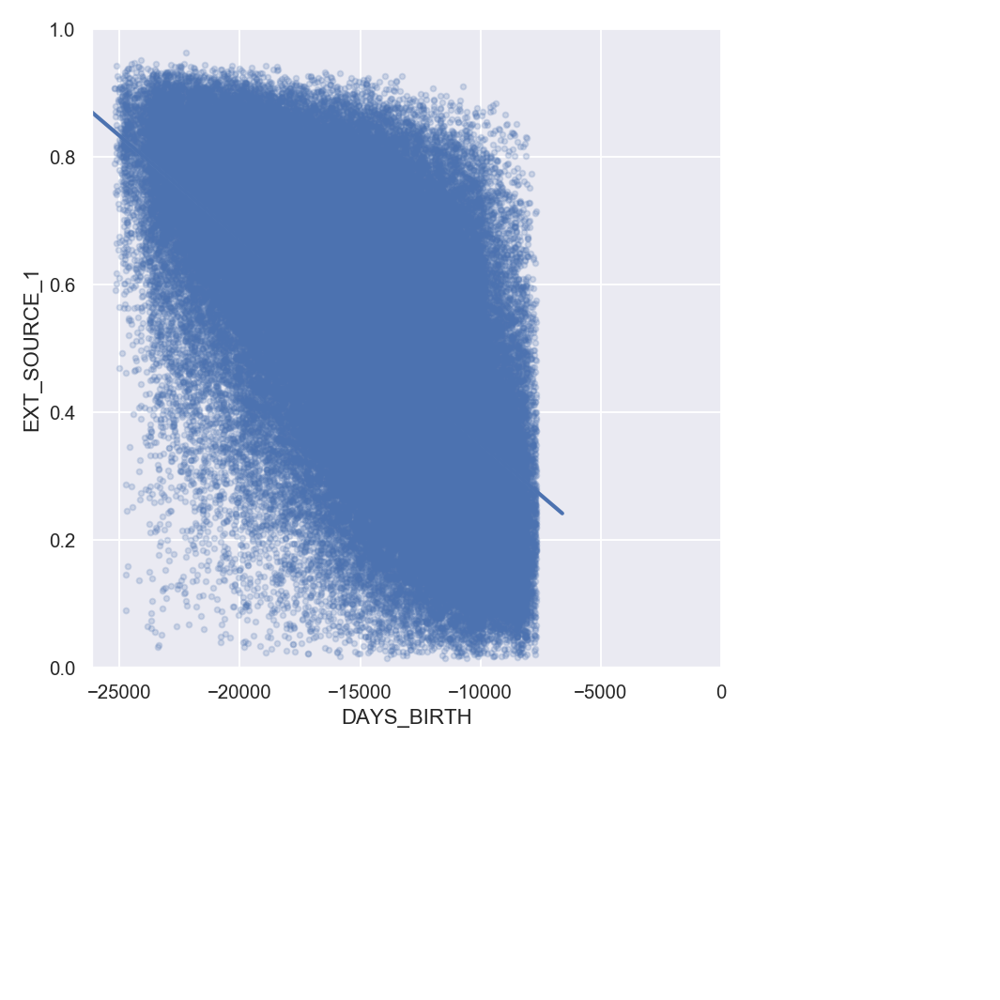

(0, 1)

In [69]:
# for the CODE_GENDER = XNA regression
sns.lmplot(data = application_train_df,
            x = 'DAYS_BIRTH',
            y = 'EXT_SOURCE_1',
            #hue = 'CODE_GENDER',
            fit_reg = True,
            scatter_kws={'alpha':.2,"s":10},
            #palette = ['green','orange'],
            legend_out = True,
            height = 6);

plt.xlim(None, 0)
plt.ylim(0, 1)

In [31]:
abs_corr['EXT_SOURCE_2'].sort_values()[-10:]

log_REGION_POPULATION_RELATIVE    0.178182
REGION_POPULATION_RELATIVE        0.178761
log_DAYS_LAST_PHONE_CHANGE        0.180904
DAYS_LAST_PHONE_CHANGE            0.207437
pwr_DAYS_LAST_PHONE_CHANGE        0.212226
EXT_SOURCE_1                      0.240032
TARGET                            0.264503
REGION_RATING_CLIENT_W_CITY       0.288502
REGION_RATING_CLIENT              0.291853
EXT_SOURCE_2                      1.000000
Name: EXT_SOURCE_2, dtype: float64

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


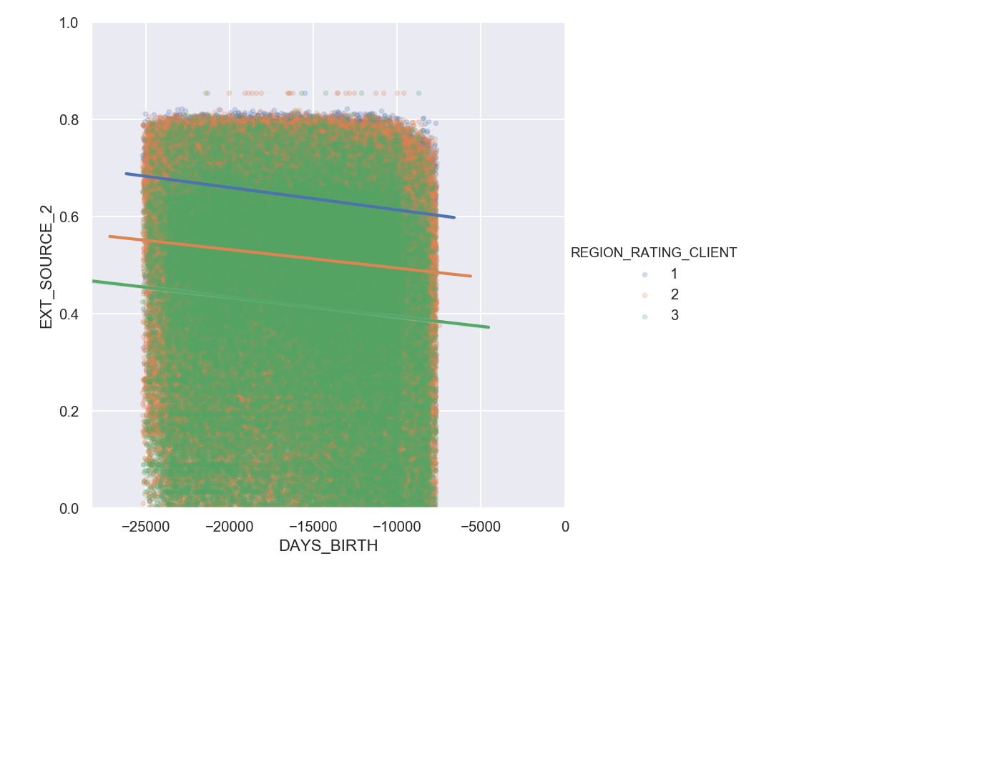

(0, 1)

In [70]:
sns.lmplot(data = application_train_df,
            x = 'DAYS_BIRTH',
            y = 'EXT_SOURCE_2',
            hue = 'REGION_RATING_CLIENT', 
            fit_reg = True,
            scatter_kws={'alpha':.2,"s":10},
            #palette = ['green','orange'],
            legend_out = True,
            height = 6);

plt.xlim(None, 0)
plt.ylim(0, 1)

In [53]:
abs_corr['EXT_SOURCE_3'].sort_values()[-15:]

pwr_DAYS_EMPLOYED                       0.119189
log_DAYS_ID_PUBLISH                     0.125965
DAYS_EMPLOYED                           0.133634
ORGANIZATION_TYPE_condensed_XNA         0.135491
FLAG_EMP_PHONE                          0.135491
NAME_INCOME_TYPE_condensed_Pensioner    0.135491
EXT_SOURCE_2                            0.145174
pwr_DAYS_ID_PUBLISH                     0.163454
DAYS_ID_PUBLISH                         0.172770
DAYS_BIRTH                              0.222332
pwr_DAYS_BIRTH                          0.223352
log_DAYS_BIRTH                          0.223755
EXT_SOURCE_1                            0.259273
TARGET                                  0.303419
EXT_SOURCE_3                            1.000000
Name: EXT_SOURCE_3, dtype: float64

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


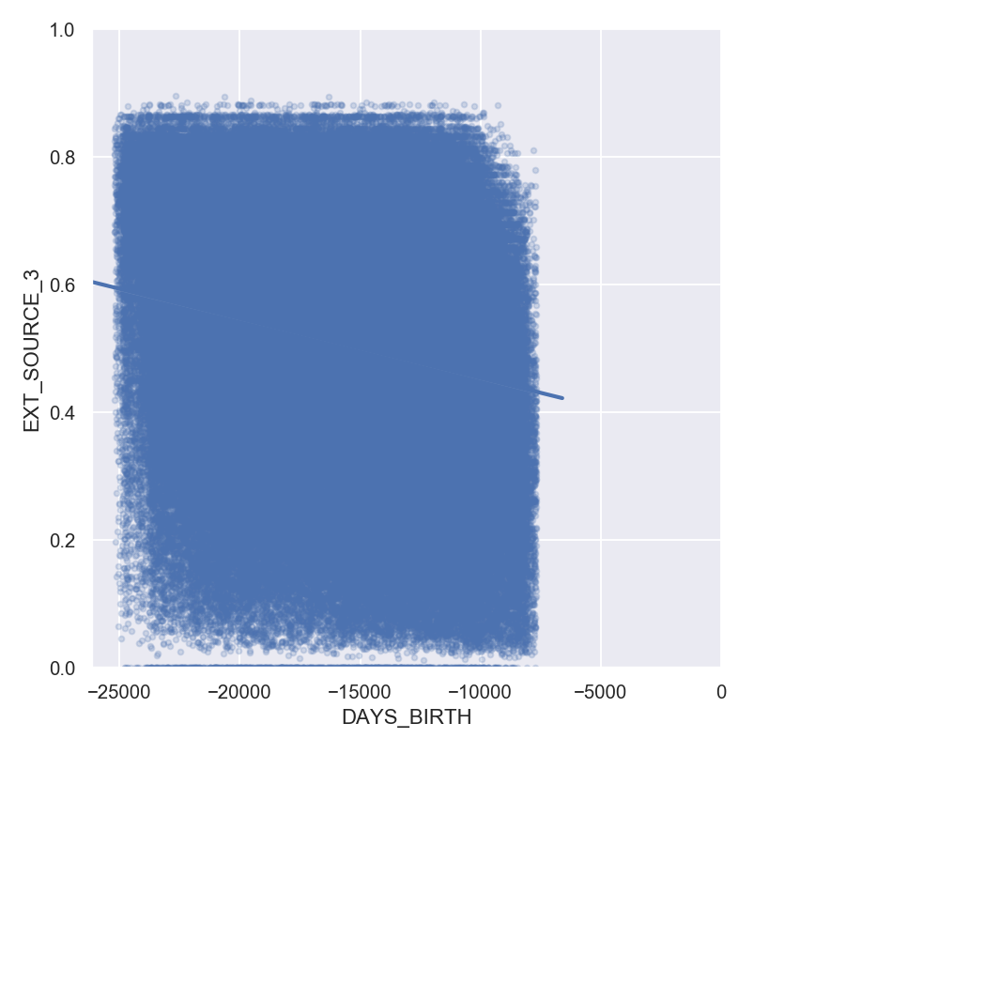

(0, 1)

In [71]:
sns.lmplot(data = application_train_df,
            x = 'DAYS_BIRTH',
            y = 'EXT_SOURCE_3',
            #hue = 'FLAG_EMP_PHONE',
            fit_reg = True,
            scatter_kws={'alpha':.2,"s":10},
            #palette = ['green','orange'],
            legend_out = True,
            height = 6);

plt.xlim(None, 0)
plt.ylim(0, 1)

In [33]:
abs_corr['REGION_RATING_CLIENT'].sort_values()[-10:]

AMT_INCOME_TOTAL                  0.188359
log_AMT_INCOME_TOTAL              0.191537
pwr_AMT_INCOME_TOTAL              0.195063
HOUR_APPR_PROCESS_START           0.288873
EXT_SOURCE_2                      0.291853
pwr_REGION_POPULATION_RELATIVE    0.424290
log_REGION_POPULATION_RELATIVE    0.499974
REGION_POPULATION_RELATIVE        0.501668
REGION_RATING_CLIENT_W_CITY       0.954714
REGION_RATING_CLIENT              1.000000
Name: REGION_RATING_CLIENT, dtype: float64

In [72]:
application_train_df.info(null_counts = True, verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 100002 to 456255
Data columns (total 121 columns):
TARGET                          307511 non-null int64
NAME_CONTRACT_TYPE              307511 non-null object
CODE_GENDER                     307511 non-null object
FLAG_OWN_CAR                    307511 non-null object
FLAG_OWN_REALTY                 307511 non-null object
CNT_CHILDREN                    307511 non-null int64
AMT_INCOME_TOTAL                307511 non-null float64
AMT_CREDIT                      307511 non-null float64
AMT_ANNUITY_from_app_train      307499 non-null float64
AMT_GOODS_PRICE                 307233 non-null float64
NAME_TYPE_SUITE                 307511 non-null object
NAME_INCOME_TYPE                307511 non-null object
NAME_EDUCATION_TYPE             307511 non-null object
NAME_FAMILY_STATUS              307511 non-null object
NAME_HOUSING_TYPE               307511 non-null object
REGION_POPULATION_RELATIVE      307511 non-null float64


# try ratio features - no strong corrs w TARGET

In [75]:
feats_for_ratios = [
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY_from_app_train',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'DAYS_LAST_PHONE_CHANGE',
]

In [78]:
feat_1 = feats_for_ratios[0]
feat_2 = feats_for_ratios[2]

application_train_df[feat_1+'_div_by_'+feat_2] = application_train_df[feat_1]/application_train_df[feat_2]

In [78]:
feat_1 = feats_for_ratios[0]
feat_2 = feats_for_ratios[2]

for feat_1 in feats_for_ratios:
    for feat_2 in feats_for_ratios:
        application_train_df[feat_1+'_div_by_'+feat_2] = application_train_df[feat_1]/application_train_df[feat_2]

In [85]:
for m in range(len(feats_for_ratios)-1):
    for n in range(m+1, len(feats_for_ratios)):
        application_train_df[feats_for_ratios[m]+'_div_by_'+feats_for_ratios[n]] = \
        application_train_df[feats_for_ratios[m]]/application_train_df[feats_for_ratios[n]]

In [88]:
df_for_corr = application_train_df[['TARGET']+[f for f in application_train_df if '_div_by_' in f]]

/anaconda/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


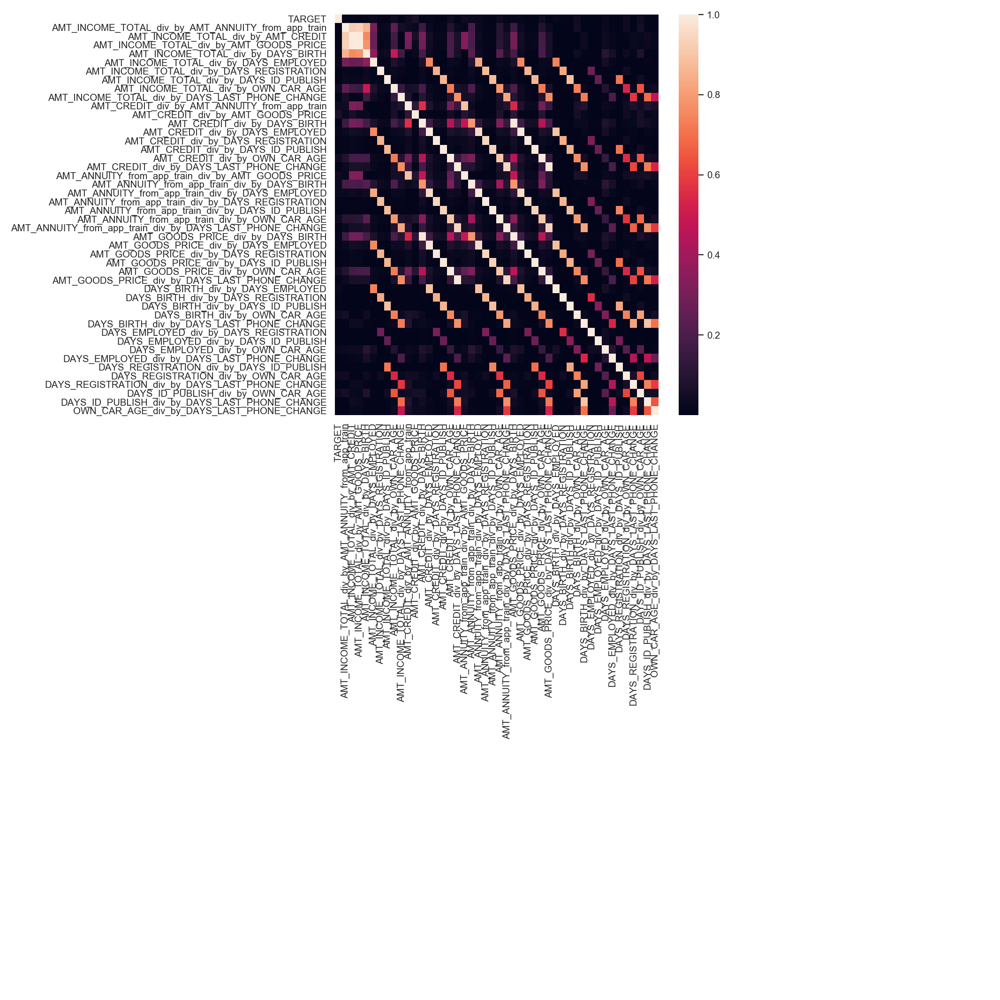

In [91]:
plt.figure(figsize= (12,12))
sns.heatmap(abs(df_for_corr.corr()), xticklabels= True, yticklabels= True) #vmax=1, vmin = -1,
plt.tight_layout()

In [95]:
abs(df_for_corr.corr())['TARGET'].sort_values()[-10:]

AMT_INCOME_TOTAL_div_by_OWN_CAR_AGE              0.031861
AMT_CREDIT_div_by_AMT_ANNUITY_from_app_train     0.032102
AMT_ANNUITY_from_app_train_div_by_OWN_CAR_AGE    0.032878
DAYS_REGISTRATION_div_by_OWN_CAR_AGE             0.033499
DAYS_ID_PUBLISH_div_by_OWN_CAR_AGE               0.035389
AMT_CREDIT_div_by_OWN_CAR_AGE                    0.038701
DAYS_BIRTH_div_by_OWN_CAR_AGE                    0.039789
AMT_GOODS_PRICE_div_by_OWN_CAR_AGE               0.041269
AMT_CREDIT_div_by_AMT_GOODS_PRICE                0.069427
TARGET                                           1.000000
Name: TARGET, dtype: float64

# continuous features I may want to bin  (althought that creates a ton of bins)

In [114]:
# get a random sample bc full sample is too much to plot
someee_sample = balanced_sample(application_train_df, 10000, 0)

In [115]:
# dropping features I already plotted above, except for a handful I want to save. 
feats_to_drop = list(set(housing_feats + doc_feats + social_circle_feats + amt_req_feats+ ['FLAG_MOBIL', 'FLAG_CONT_MOBILE']) - \
{'EMERGENCYSTATE_MODE', 'APARTMENTS_AVG', 'LANDAREA_AVG', 'TOTALAREA_MODE', # these have a bit of info in them
'FLAG_DOCUMENT_3','FLAG_DOCUMENT_6', # these have a bit of info in them
'OBS_60_CNT_SOCIAL_CIRCLE',   # there is no info here, but keeping it as representative feature 
'AMT_REQ_CREDIT_BUREAU_YEAR'  # there is not a lot of info here, but keeping it as representative feature 
})

someee_sample.drop(columns= feats_to_drop, inplace=True)

In [116]:
feats_to_bin = ['OWN_CAR_AGE',                  
                'APARTMENTS_AVG',          
                'LANDAREA_AVG',              
                'TOTALAREA_MODE',         
                'OBS_60_CNT_SOCIAL_CIRCLE',       
                'AMT_REQ_CREDIT_BUREAU_YEAR',
               ]

In [119]:
is_null_pd = someee_sample[feats_to_bin].isnull()
new_names_dict = {f:f+'_isnull' for f in feats_to_bin}
is_null_pd.rename(columns= new_names_dict, inplace=True)
someee_sample = pd.concat([someee_sample, is_null_pd], axis = 1, sort = False)

<IPython.core.display.Javascript object>


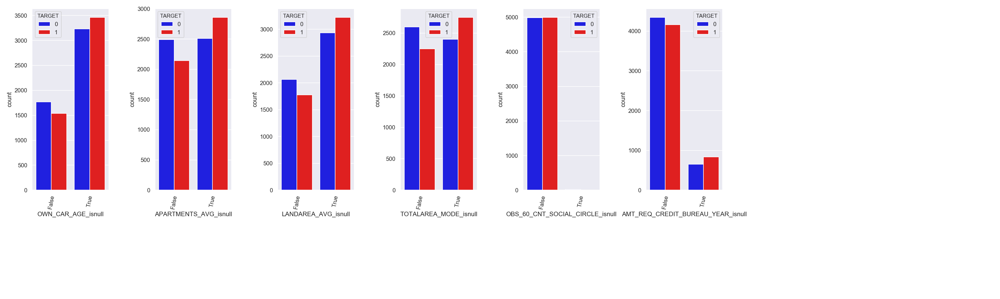

In [131]:
these_feats = [f for f in someee_sample.columns if '_isnull' in f]
this_df = someee_sample
# number of values for each feature for plot sizing
ratios = [len(np.unique(this_df[f])) for f in these_feats]
tot_width = sum(ratios)/.6

fig, axs = plt.subplots(nrows = 1,
                        ncols = len(these_feats),
                        gridspec_kw = {'width_ratios':ratios},
                        figsize = (tot_width, 6));

for f, a in zip(these_feats, range(len(these_feats))):
    g = sns.countplot(x = f,
                     hue = "TARGET", 
                     data = this_df, 
                     palette = ['blue','red'], 
                     ax = axs[a]
                    );
    g.set_xticklabels(g.get_xticklabels(), 
                      rotation = 80);

plt.tight_layout()

<IPython.core.display.Javascript object>


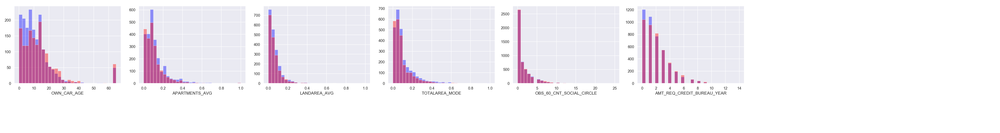

In [139]:
this_df = someee_sample
my_list = feats_to_bin
num_plots = len(my_list)

fig, axs = plt.subplots(nrows = 1,
                        ncols = num_plots,
                        figsize = (num_plots*5,  4));

for f, a in zip(my_list, range(len(my_list))):

    dat = this_df[ (this_df[f].notna() )][f]
    dat_0 = this_df[ (this_df['TARGET']== 0) & (this_df[f].notna())][f]
    dat_1 = this_df[ (this_df['TARGET']== 1) & (this_df[f].notna())][f]

    my_bins = np.histogram(dat.values, bins = 30)[1]
    
    g0 = sns.distplot(dat_0, color = 'blue', ax = axs[a], bins = my_bins, kde = False)
    g1 = sns.distplot(dat_1, color = 'red',  ax = axs[a], bins = my_bins, kde = False)
    
   # g0.set_xticklabels(g.get_xticklabels(),rotation = 80)

plt.tight_layout()